# Estimating space- and time-varying transmission rate from data

### Scenario

It is common that we want to account for and quanitfy heterogeneity in transmission rates among localities to better understand the regional picture of pathogen spread. Therefore, we may have a spatial model with multiple nodes, and we want to understand from data how the transmission rate varies among localities. We may also want to quantify this spatial heterogeneity while also accounting for host movement among localities. In `epymorph`, we have built convenient parameter estimation functionality that allows us to estimate location- and time-varying parameters. In this scenario, we will explore how to set up the model and particle filter simulation for a multi-node system. 

# Exercise 1

First, we will develop a multi-node simulation that does not include the effects of movement.

In [1]:
import numpy as np
import matplotlib.pyplot as plt

from epymorph.kit import *
from epymorph.adrio import acs5

from epymorph.adrio import us_tiger

from epymorph.forecasting.pipeline import (
    FromRUME,
    ParticleFilterSimulator,
    Observations,
    ModelLink,
    UnknownParam
)

from epymorph.forecasting.likelihood import Poisson,Gaussian,NegativeBinomial
from epymorph.forecasting.dynamic_params import BrownianMotion
from epymorph.forecasting.dynamic_params import GaussianPrior
from epymorph.forecasting.param_transformations import ExponentialTransform

from epymorph.adrio.cdc import InfluenzaStateHospitalization
from epymorph.time import EveryNDays

- [ ] Design the custom initializer `RandomLocationsAndRandomSeed`. This initializer will seed a set of random locations with a uniformly distributed number of number on [0,seed_max]. The number of infected are then distributed among the locations via a multivariate hypergeometric draw. It is critical to randomly initialize the initial state of the system for the particle filter when the initial condition of the system is unknown. 

Our custom initializer is a subclass of `SeededInfection`, which seeds the infectious compartments at each geo node. The class constructor `__init__` is just standard boilerplate calling back to the parent class. The function `evaluate` is identical to the class `RandomLocations` except for the addition of random sampling for the initial seed.  

In [2]:
from typing_extensions import override
from epymorph.initializer import _POPULATION_ATTR
from epymorph.initializer import *

class RandomLocationsAndRandomSeed(SeededInfection):
    """
    Seed an random number of infected in a number of randomly selected locations.

    Requires "population" as a data attribute.

    Parameters
    ----------
    num_locations :
        The number of locations to choose.
    seed_max :
        The maximum number of individuals to infect.
    initial_compartment :
        Which compartment (by index or name) is "not infected", where most individuals
        start out.
    infection_compartment :
        Which compartment (by index or name) will be seeded as the initial infection.
    """

    requirements = (_POPULATION_ATTR,)

    num_locations: int
    """The number of locations to choose (randomly)."""
    seed_max: int
    """The maximum number of individuals to infect, drawn uniformly on [0,seed_max]."""

    def __init__(
        self,
        num_locations: int,
        seed_max: int,
        initial_compartment: int | str = SeededInfection.DEFAULT_INITIAL,
        infection_compartment: int | str = SeededInfection.DEFAULT_INFECTION,
    ):
        super().__init__(initial_compartment, infection_compartment)
        self.num_locations = num_locations
        self.seed_max = seed_max

    @override
    def evaluate(self) -> SimArray:
        """
        Evaluate the initializer in the current context.

        Returns
        -------
        :
            The initial populations for each node and IPM compartment.
        """
        N = self.scope.nodes
        if not 0 < self.num_locations <= N:
            err = (
                "Initializer argument 'num_locations' must be "
                f"a value from 1 up to the number of locations ({N})."
            )
            raise InitError(err)

        indices = np.arange(N, dtype=np.intp)
        selection = self.rng.choice(indices, self.num_locations)
        seed_size = self.rng.integers(low = 0, high = self.seed_max, endpoint=True)

        sub = IndexedLocations(
            selection=selection,
            seed_size=seed_size,
            initial_compartment=self.initial_compartment,
            infection_compartment=self.infection_compartment,
        )
        return self.defer(sub)

- [ ] Construct a RUME with a scope consisting of four States, but assume that there is no movement between the states. Essentially, this simulates four independent populations. Use an SIRH IPM. In each State, initialize a small fraction initially infectious.

In [3]:
states = ["AZ", "CO", "NM", "NV"]
rume = SingleStrataRUME.build(
    ipm=ipm.SIRH(),
    mm=mm.No(),
    scope=StateScope.in_states(states, year=2015),
    init=RandomLocationsAndRandomSeed(
        num_locations=len(states),
        seed_max=10_000
    ),
    time_frame=TimeFrame.of("2022-09-15", 7 * 26 + 1),
    params={
        "beta": ExponentialTransform('log_beta'),
        "gamma": 0.2,
        "xi": 1 / 365,
        "hospitalization_prob": 200 / 100_000,
        "hospitalization_duration": 5.0,
        "population": acs5.Population(),
        "centroid": us_tiger.InternalPoint(),
    },
)

- [ ] Construct the Observations object. This describes the observations we would like to fit to using particle filter. We utilize the `InfluenzaStateHospitalization` ADRIO for data, which gives the sum of new hospitalizations over a weekly period. 

In [4]:
from epymorph.forecasting.likelihood import NegativeBinomial,AdaptiveGaussian


observations = Observations(
    source=InfluenzaStateHospitalization(),
    model_link=ModelLink(
        quantity=rume.ipm.select.events("I->H"),
        time=rume.time_frame.select.all().group(EveryNDays(7)).agg(),
        geo=rume.scope.select.all(),
    ),
    likelihood=Gaussian(10.0),
)

- [ ] Define the unknown parameters and their dynamics. The prior describes the probability distribution we draw from to initialize the parameter for each particle. The dynamics describe how the parameter evolves in time. 

In [5]:

unknown_params = {
        "log_beta": UnknownParam(
        prior=GaussianPrior(mean = np.log(0.2),standard_deviation=0.5),
        dynamics=BrownianMotion(
           voliatility = 0.1
        ))
        }


- [ ] Define the particle filter object. num_realizations is the number of particles to use in the algorithm run. save_trajectories saves the state of each particle at each simulation tau tick, this is useful for inference but may be memory intensive for multi-node systems. 

In [6]:
from epymorph.forecasting.pipeline import EnsembleKalmanFilterSimulator,ParticleFilterSimulator


num_realizations = 200

particle_filter_simulator = EnsembleKalmanFilterSimulator(
        config=FromRUME(rume,num_realizations,unknown_params = unknown_params),
        observations= observations,
        save_trajectories=True,
    )


In [7]:
rng = np.random.default_rng(0)
particle_filter_output = particle_filter_simulator.run(rng=rng)

Observation: 26, Label: 2023-03-16, Time Frame: 2023-03-16 (1D)-03-15 (7D)
Runtime with 200 members and 4 Nodes is 53.71 seconds.


- [ ] Plot the output of the particle filtering algorithm against the real data. 

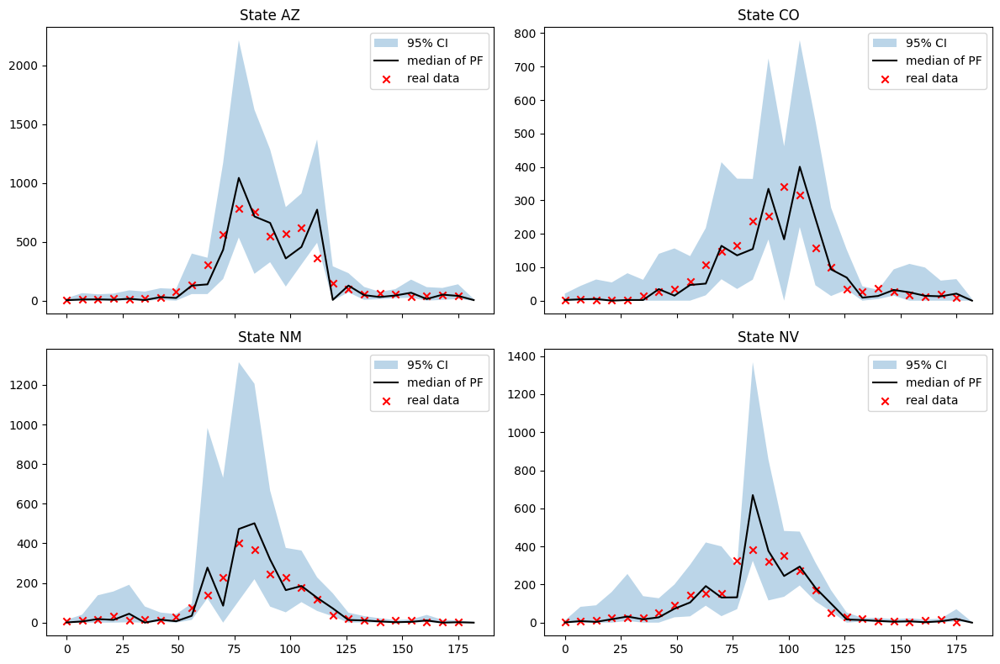

In [8]:
from epymorph.simulation import Context
from epymorph.attribute import NamePattern
from math import ceil

context = Context.of(
    scope=rume.scope,
    time_frame=rume.time_frame
)

real_data_result = (
    observations.source.with_context_internal(context).inspect().result
)
real_data = real_data_result["value"]

data_date_range = np.arange(0,rume.time_frame.days,7)
sim_date_range = np.arange(0,rume.time_frame.days,1)

n = len(states)
cols = 2
rows = ceil(n / cols)

fig, axes = plt.subplots(rows, cols, figsize=(6*cols, 4*rows), sharex=True)
axes = axes.flatten()

for i in range(n):
    ax = axes[i]
    ax.set_title(f'State {states[i]}')

    lower = np.percentile(particle_filter_output.posterior_values[:, :, i], 2.5, axis=1).squeeze()
    upper = np.percentile(particle_filter_output.posterior_values[:, :, i], 97.5, axis=1).squeeze()
    mean  = np.median(particle_filter_output.posterior_values[:, :, i], axis=1).squeeze()

    ax.fill_between(data_date_range, lower, upper, label='95% CI',alpha = 0.3)
    ax.plot(data_date_range, mean, color='black', label='median of PF')

    ax.scatter(data_date_range[:-1],real_data[:,i],marker = 'x',color = 'red',label = 'real data')
    ax.legend()

for j in range(i+1, rows*cols):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

fig.tight_layout()


We see a strong fit to the data for three of the states, Nevada has difficulty fitting the model with the data between day 75 and 100. The 95% credible interval describes the interval within which 95% of the particles fall. 

- [ ] Plot the inferred value of $\beta$ for each location over time.

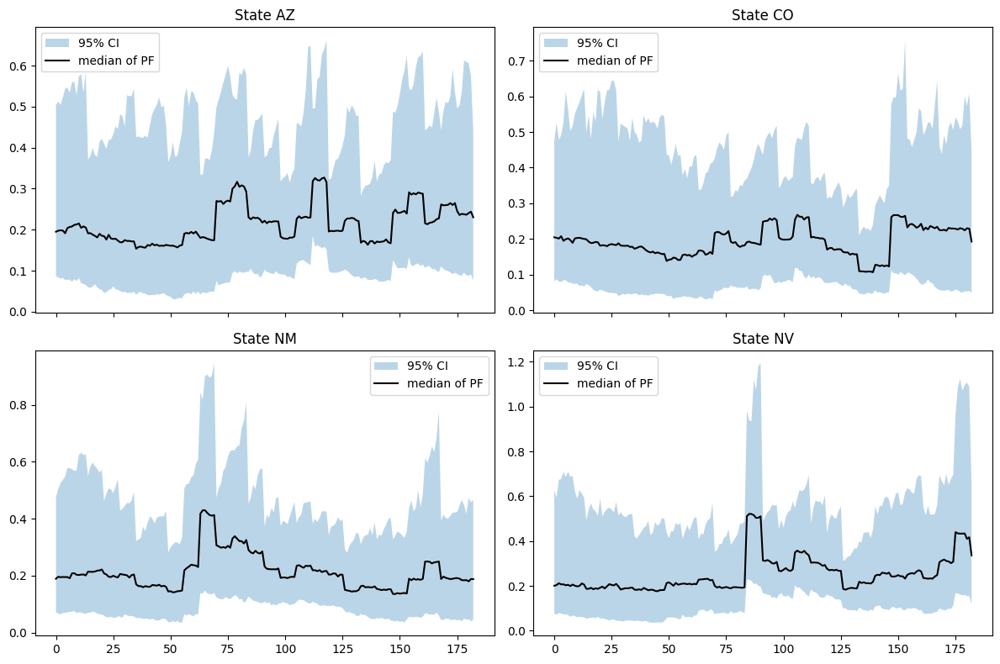

In [9]:
cols = 2
rows = ceil(n / cols)

fig, axes = plt.subplots(rows, cols, figsize=(6*cols, 4*rows), sharex=True)
axes = axes.flatten()


for i in range(n):
    ax = axes[i]
    ax.set_title(f'State {states[i]}')

    lower = np.percentile(particle_filter_output.estimated_params[NamePattern.of("log_beta")][:, :, i], 2.5, axis=0).squeeze()
    upper = np.percentile(particle_filter_output.estimated_params[NamePattern.of("log_beta")][:, :, i], 97.5, axis=0).squeeze()
    median  = np.median(particle_filter_output.estimated_params[NamePattern.of("log_beta")][:, :, i], axis=0).squeeze()

    ax.fill_between(sim_date_range, np.exp(lower), np.exp(upper), label='95% CI',alpha = 0.3)
    ax.plot(sim_date_range, np.exp(median), color='black', label='median of PF')
    ax.legend()

for j in range(i+1, rows*cols):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

 We see a relatively stationary value of $\beta$ for each location. While seasonal osciallations can be expected in $\beta$ for certain diseases, agressive and non-smooth oscillations are often indicative of model error.

- [ ] Plot the inferred compartment values for $S,I,R,H$ from the particle filter run. 

In [10]:
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 800

a = particle_filter_output.compartments.shape[3]  
compartment_labels = ['S','I','R','H']

rows = n                 
cols = a                  

fig, axes = plt.subplots(rows, cols,
                         figsize=(6*cols, 3.5*rows),
                         sharex=True)

axes = np.atleast_2d(axes)

for i in range(n):             
    for k in range(a):          
        ax = axes[i, k]

        data = particle_filter_output.compartments[:, :, i, k]

        lower = np.percentile(data, 2.5, axis=0).squeeze()
        upper = np.percentile(data, 97.5, axis=0).squeeze()
        median  = np.median(data, axis=0).squeeze()

        ax.fill_between(sim_date_range, lower, upper,label = '95% CI',alpha = 0.3)
        ax.plot(sim_date_range, median, color='black',label = 'median of PF')

        if i == 0:
            ax.set_title(f'Compartment {compartment_labels[k]}')
        if k == 0:
            ax.set_ylabel(f'State {states[i]}')

        ax.legend()

plt.tight_layout()
plt.show()


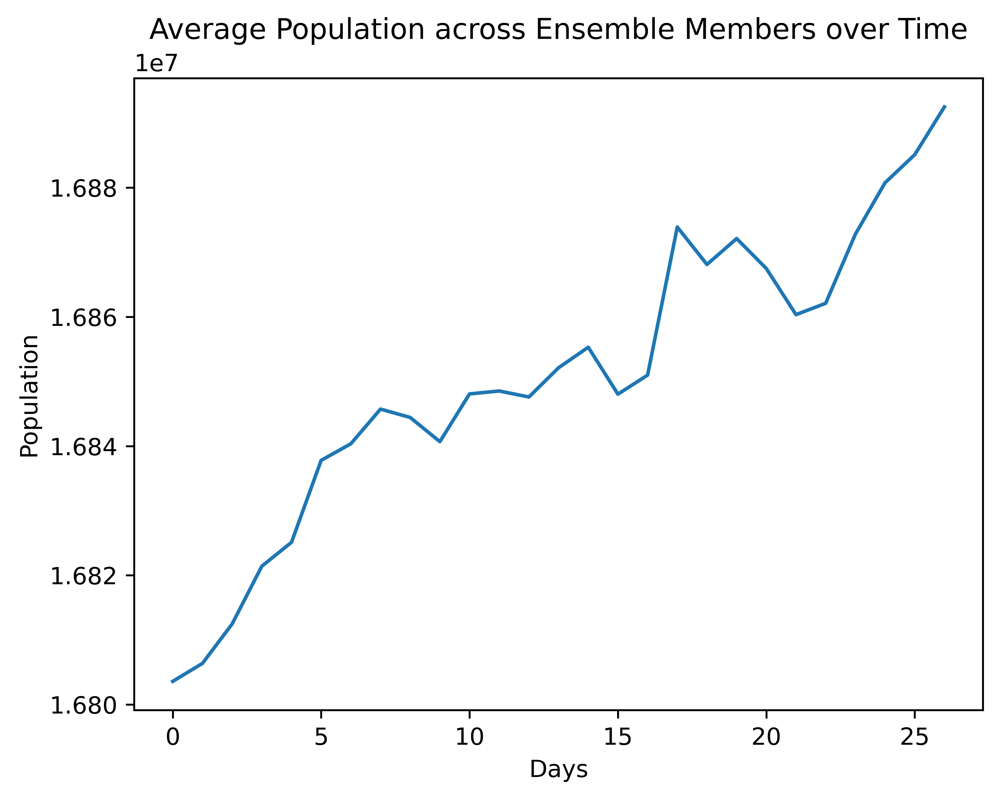

In [11]:
plt.title('Average Population across Ensemble Members over Time')
plt.plot(particle_filter_output.pop_avgs)
plt.xlabel('Days')
plt.ylabel('Population')
plt.show()

## Notes 

As in the single node example we observe a strong sawtooth effect due to the sparsity of the data. Posterior distributions adjust sharply each week when new data becomes available. In this example the issue is compounded due to model error. Model error is the discrepancy between the real epidemiological processes that generated the data and the prescribed model. As our SIRH model is a significant approximation of the complex processes underlying influenza spread, the model error is non-trivial. 

# Exercise 2

The following will fit the same model as above using a daily data source. From August 1st, 2020 to April 30th, 2024 the CDC required hospitals report data on new admissions and total hospitalizations daily. The facility level daily hospitalization data is not available for privacy reasons, however the state aggregations are. We can then fit our model using daily observations of the new hospitalizations and compare the fit to the weekly data. 

- [ ] Construct an ADRIO to sample the daily data source. We first use pandas to extract the necessary columns from the data source. 

In [12]:
import pandas as pd
from epymorph.adrio import csv


columns = ['date','state','previous_day_admission_influenza_confirmed','total_patients_hospitalized_confirmed_influenza']

df = pd.read_csv('./epymorph/forecasting/COVID-19_Reported_Patient_Impact_and_Hospital_Capacity_by_State_Timeseries__RAW_.csv')

df = df[df['state'].isin(states)][columns]
df['date'] = pd.to_datetime(df['date'])

df = df.sort_values(['state','date'])
df = df.reset_index(drop = True)

date_range = rume.time_frame.to_date_range().to_pandas()
df = df[df['date'].isin(date_range)][columns]

state_mapping = {state:id for state,id in zip(states,rume.scope.node_ids)}
df['state'] = df['state'].map(state_mapping)
df[['previous_day_admission_influenza_confirmed',
    'total_patients_hospitalized_confirmed_influenza']] = df[['previous_day_admission_influenza_confirmed',
                                                              'total_patients_hospitalized_confirmed_influenza']].astype(int)
df.columns = ['date','geoid','value1','value2']
df.to_csv(f'./epymorph/forecasting/daily_data_SW.csv',index = False)

csvadrio_daily = csv.CSVFileAxN(
    file_path='./epymorph/forecasting/daily_data_SW.csv',
    dtype=np.int64,
    key_col=1,
    key_type="geoid",
    time_col=0,
    data_col=2,
    skiprows=1
)

- [ ] Now we construct a new Observations object. We need to change the aggregation of the data as well as the likelihood function. The daily data tends to be overdispersed and a Negative Binomial likelihood function is therefore more appropriate. The parameter r controls the overdispersion of the observations. As r increases the Negative Binomial distribution approximates the Poisson distribution. 

In [13]:
observations_daily = Observations(
    source=csvadrio_daily,
    model_link=ModelLink(
        quantity=rume.ipm.select.events("I->H"),
        time=rume.time_frame.select.all().group(EveryNDays(1)).agg(), #Changed from 1 day to 7 days
        geo=rume.scope.select.all(),
    ),
    likelihood=Gaussian(100.0), #Changed to a negative binomial likelihood
)

We now setup a new particle filter simulator with the updated observations and likelihood. 

In [14]:

particle_filter_simulator_daily = EnsembleKalmanFilterSimulator(
        config=FromRUME(rume,num_realizations,unknown_params = unknown_params),
        observations= observations_daily,
        save_trajectories=True,
    )

In [15]:
particle_filter_output_daily = particle_filter_simulator_daily.run(rng=rng)

Observation: 182, Label: 2023-03-16, Time Frame: 2023-03-16 (1D)
Runtime with 200 members and 4 Nodes is 244.71 seconds.


- [ ] Plot the particle filter output. Here we plot the data fit for each of the four locations. 

In [16]:
from epymorph.simulation import Context

context = Context.of(
    scope=rume.scope,
    time_frame=rume.time_frame
)

real_data_result = (
    observations_daily.source.with_context_internal(context).inspect().result
)
real_data = real_data_result["value"]

data_date_range = np.arange(0,rume.time_frame.days,1)
sim_date_range = np.arange(0,rume.time_frame.days,1)

n = len(states)
cols = 2
rows = ceil(n / cols)

fig, axes = plt.subplots(rows, cols, figsize=(6*cols, 4*rows), sharex=True)
axes = axes.flatten()

for i in range(n):
    ax = axes[i]
    ax.set_title(f'State {states[i]}')

    lower = np.percentile(particle_filter_output_daily.posterior_values[:, :, i], 2.5, axis=1).squeeze()
    upper = np.percentile(particle_filter_output_daily.posterior_values[:, :, i], 97.5, axis=1).squeeze()
    median  = np.median(particle_filter_output_daily.posterior_values[:, :, i], axis=1).squeeze()

    ax.fill_between(data_date_range, lower, upper, alpha=0.3, label='95% CI')
    ax.plot(data_date_range, median, color='black', label='Mean of PF')

    ax.scatter(data_date_range,real_data[:,i],marker = 'x',color = 'red',label = 'real data')

    ax.legend()

for j in range(i+1, rows*cols):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


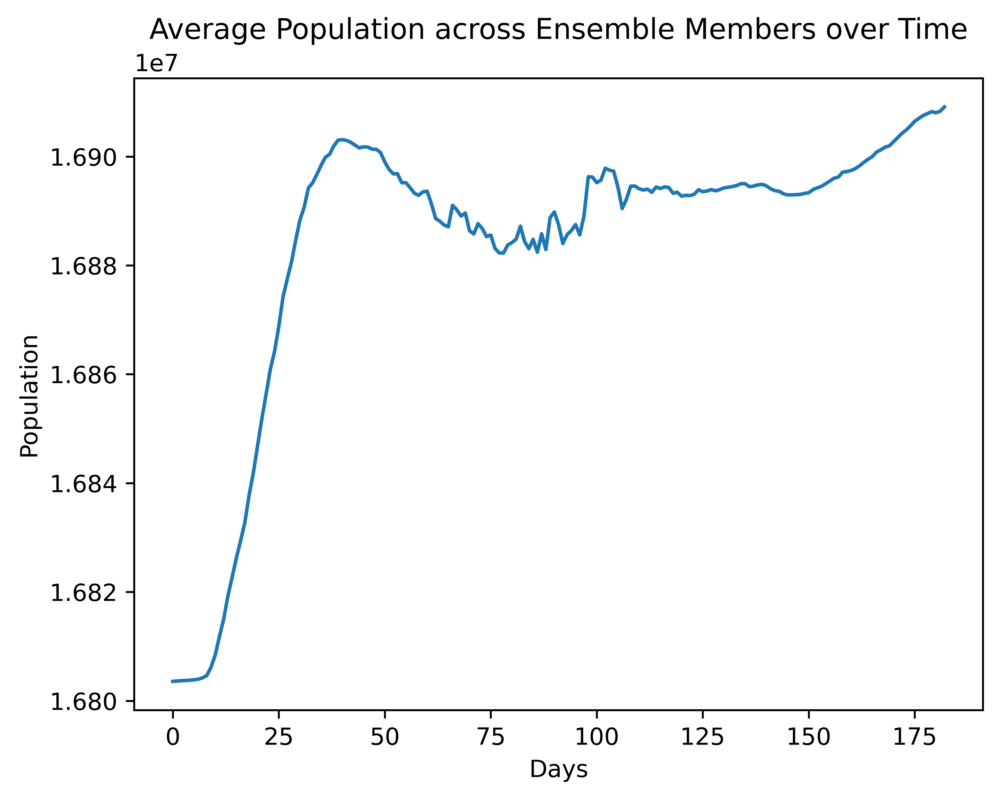

In [17]:
plt.title('Average Population across Ensemble Members over Time')
plt.plot(particle_filter_output_daily.pop_avgs)
plt.xlabel('Days')
plt.ylabel('Population')
plt.show()

In [18]:
cols = 2
rows = ceil(n / cols)

fig, axes = plt.subplots(rows, cols, figsize=(6*cols, 4*rows), sharex=True)
axes = axes.flatten()


for i in range(n):
    ax = axes[i]
    ax.set_title(f'State {states[i]}')

    lower = np.percentile(particle_filter_output.estimated_params[NamePattern.of("log_beta")][:, :, i], 2.5, axis=0).squeeze()
    upper = np.percentile(particle_filter_output.estimated_params[NamePattern.of("log_beta")][:, :, i], 97.5, axis=0).squeeze()
    median  = np.median(particle_filter_output.estimated_params[NamePattern.of("log_beta")][:, :, i], axis=0).squeeze()

    lower_daily = np.percentile(particle_filter_output_daily.estimated_params[NamePattern.of("log_beta")][:, :, i], 2.5, axis=0).squeeze()
    upper_daily = np.percentile(particle_filter_output_daily.estimated_params[NamePattern.of("log_beta")][:, :, i], 97.5, axis=0).squeeze()
    median_daily  = np.median(particle_filter_output_daily.estimated_params[NamePattern.of("log_beta")][:, :, i], axis=0).squeeze()

    ax.fill_between(sim_date_range, np.exp(lower_daily), np.exp(upper_daily), alpha=0.3, label='95% CI for Daily PF')
    ax.plot(sim_date_range, np.exp(median_daily), color='black', label='Median of Daily PF')

    ax.plot(sim_date_range, np.exp(median), label='Median of Weekly PF',color = 'red')
    
    ax.legend()

for j in range(i+1, rows*cols):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

We observe a $\beta$ which is qualitatively similar to the estimate from the weekly inference. However, the dynamics are more finely resolved and we reduce the stepping effect observed with the weekly estimate. 

- [ ] Finally, let's look at the inference of the observed states. We can also validate our model by comparing the dynamics of the $H$ compartment with the real counts from the CDC. 

In [19]:
a = particle_filter_output_daily.compartments.shape[3]
compartment_labels = ['S','I','R','H']

rows = n                      
cols = a                       

fig, axes = plt.subplots(rows, cols,
                         figsize=(6*cols, 3.5*rows),
                         sharex=True)


axes = np.atleast_2d(axes)

for i in range(n):             
    for k in range(a):         
        ax = axes[i, k]

        data = particle_filter_output_daily.compartments[:, :, i, k]

        lower = np.percentile(data, 2.5, axis=0).squeeze()
        upper = np.percentile(data, 97.5, axis=0).squeeze()
        median  = np.median(data, axis=0).squeeze()

        ax.fill_between(sim_date_range, lower, upper, alpha=0.3,label = '95% CI')
        ax.plot(sim_date_range, median, color='black',label = 'Median of PF')

        if k == 3:
            ax.scatter(sim_date_range,df[df['geoid'] == rume.scope.node_ids[i]]['value2'],color = 'red',marker = 'x',label = 'Hospitalization data')
        if i == 0:
            ax.set_title(f'Compartment {compartment_labels[k]}')
        if k == 0:
            ax.set_ylabel(f'State {states[i]}')

        ax.legend()

plt.tight_layout()
plt.show()


The latent state estimation is vastly improved and the estimated trajectories are reasonable for the $H$ compartment. The algorithm is more able to account for model error at this daily data resolution. 